<div>
   <table width="100%" height="100%" align="center" valign="center" bgcolor="white" bordercolor="white">
   <tr><td>
      <img align="left" style="margin-top: auto; margin-bottom: auto;" src="https://locate.geospatialcouncil.org.au/wp-content/uploads/sites/2/2023/07/LOCATE-24-website-logo.png" width="375"/>
   </td>
   <td>
      <img align="right" style="margin-top: auto; margin-bottom: auto;" src="https://www.cqc2t.org/wp-content/uploads/2018/02/partner-uom2.png" width="425"/>
   </td></tr>
   </table>
</div>

# **Earth Observation and AI Applications: Addressing Small Geo-Spatial Dataset Problems**
<!-- <img src="https://www.cqc2t.org/wp-content/uploads/2018/02/partner-uom2.png" width="425"/> <img src="https://locate.geospatialcouncil.org.au/wp-content/uploads/sites/2/2023/07/LOCATE-24-website-logo.png" width="425"/>  -->

*Jagannath Aryal, Bipul Neupane, Sumesh K C*

*Earth Observation and AI Research Group, Department of Infrastructure Engineering, The University of Melbourne*

## Contents of this Hands-on
1. Introduction
2. Short Introduction About the Team
3. Basic preparation
4. About Dataset
6. CNNs for EO Image Segmentation
7. Addressing Small Data Problem
 * Transfer Learning
 * Data Augmentation
 * Automated Data Pipeline with API services
8. Possible Issues

## A. Introduction
Over the last decade, Artificial Intelligence (AI) technologies, Machine Learning (ML) and Deep Learning (DL), have been increasingly used for a variety of Earth Observation (EO) applications, particularly segmentation, object detection and localisation, and forecasting tasks. When a sufficient training dataset is available, the DL methods can accurately and efficiently work. However, the lack of precise and sufficient labelling information significantly challenges the preparation of a large training dataset. Thus, small geo-spatial dataset problems are prominent in various domains and result in poor models.

This workshop aims to introduce and present hands-on methods for more efficient training of DL models for EO applications under a small (limited) training dataset. An overview of the small dataset problem and promising DL techniques to overcome the challenges for case-specific EO applications will be provided. This will enable Geospatial industry stakeholders to contextualise and select fit-for-purpose DL methods for their use cases. Such fit-for-purpose algorithmic methods will aid in the decision processes of, for example, private sectors [Geoscape, NearMap] and government sectors [DEECA] and users (students, engineers, and scientists).

**Geospatial industry – relevance**
1. Stakeholders (industry, clients)
 - NearMap, DEECA, Graduate Researchers


2. How will the stakeholders benefit from the workshop?
 - Understand the fundamentals of EO and AI, small dataset problems and techniques to work with these problems.
 The relevant hands-on session will allow the participants to understand and test the DL methods that could be implemented (with/without changes) in their task.


3. How will stakeholders from different disciplines benefit from the workshop?*
 - Theoretical knowledge of EO and AI, small dataset problems and techniques to overcome the problems.
 - The hands-on session will enable the participants to reflect on their discipline-related tasks and implement the DL methods accordingly to grow their business.


This is a dedicated hands-on coding lab on urban building footprint extraction. In this session, the workshop materials are provided in the form of Jupyter Notebook that uses the PyTorch DL framework and can be executed on  cloud or a personal computer (by setting up a Python enivronment with the required Python libraries installed). We recommend using [Google Colab](https://colab.google/) as it provides access to free GPUs for more efficient training.

The workshop will be suitable for industry practitioners, undergraduate and graduate students, engineers, and scientists. The participants are expected to have basic knowledge and skills in EO, ML and Python programming.

**Specific skills that will be covered**

Fundamentals of EO and AI; small geo-spatial dataset problems; transfer learning; lightweight DL network architectures

<a id='short_intro_team'></a>
### A1. Short Introduction About the Team
**A/Prof Jagannath Aryal**\
A/Prof Dr Jagannath Aryal is a research leader of the Earth Observation and AI research group at The University of Melbourne. He is an Associate Editor of the prestigious journal IEEE Transactions on Geoscience and Remote Sensing and a national chair of the GIS, Digital Analytics and Remote Sensing (GDARS) area of practice of the Geospatial Council of Australia (GCA). Email: jagannath.aryal@unimelb.edu.au

**Bipul Neupane**\
Bipul Neupane is a third-year PhD Candidate in Geomatics under the Earth Observation and AI Research Group, Faculty of Engineering and IT, The University of Melbourne. His research topic is “Earth Observation and AI for Urban Building Footprint Extraction". Email: bneupane@student.unimelb.edu.au

**Sumesh K C**\
Sumesh KC is a third-year PhD candidate in Geomatics and is under the Earth Observation and AI Research Group, Faculty of Engineering and Information Technology, The University of Melbourne. His research topic is “Fusion of Multi-sensor Earth Observation Data in Identification, Mapping, Monitoring and Modelling of Croplands”. Email: sumesh.kc@student.unimelb.edu.au

### A2. Key Take-away
What you will be doing in this Hands-on:
1.	Setting up a deep learning environment in Google Drive
2.	Use Python Program, Google Colab, and free GPU resources
3.	Extract building footprints (polygons) of Massachusetts, Boston
4.	Train an image segmentation model called U-Net with MobileOne CNN from Apple
5.	Evaluate the model, visualise predictions, and make interpretations
6.	Address the small geospatial dataset problem using:
  * Transfer learning
  * Data Augmentation
  * Automated Data Pipeline with API services


## B. Basic Preparation

### B1. Fetching this Notebook and files in your Google Drive (First Time)

There is a separate Notebook that you need to download and use in order to setup the working directory and fetch data and other files from GitHub to your Google Drive. Follow these steps for the first time:

1. Create a directory (aka. folder) named "WORKSPACE" in your Google Drive.
2. Download the following file from the link and upload it into the "WORKSPACE" folder in your Google Drive. Downloader: https://github.com/bipulneupane/EOandAIWorkshop/blob/main/notebook/Locate_downloader.ipynb
3. Open the file from your Google Drive (double click), and follow the steps.

### B2. Connect to Google Drive (From second time)

1. Mount your Google Drive
2. Navigate to the working directory (folder)

In [ ]:
# Mounting (connecting) Google Drive
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [ ]:
# Navigate to the working directory (folder)
%cd /gdrive/My\ Drive/WORKSPACE/EOandAIWorkshop

# Now that we are in the "EOandAIWorshop" folder, this Notebook will run with all files in correct place.

[Errno 2] No such file or directory: '/gdrive/My Drive/WORKSPACE/EOandAIWorkshop'
/content


### B3. Connecting to Google Colab's GPU

Make sure you use a GPU to run this Colab, by changing the settings from the ribbon above. Go to 'Runtime', 'Change runtime type', and select 'GPU' from the options.



In [ ]:
# Checking whether or not GPU is available
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Wed May  1 00:13:23 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

### B4. Python Libraries

We will be using the following python libraries  in this tutorial.

Common libraries
* `os`: system level module for handling files and file structures
* `sys`: module that allows to manipulate different parts of the Python runtime environment
* `cv2`: highly optimized library for computer vision task
* `numpy`: library used for working with arrays
* `matplotlib`: comprehensive library for creating static, animated, and interactive visualizations in Python

Libraries of focus for today
* `torch`: fully featured framework for building deep learning models (https://pytorch.org/)
* `segmentation_models_pytorch`: Python library with Neural Networks for image segmentation based on PyTorch (https://segmentation-modelspytorch.readthedocs.io/en/latest/)
* `albumentations`: fast and flexible image augmentations (https://albumentations.ai/docs/)

### B5. Installing Python Libraries

Here is the guide to installing python libraries as the dependency of this Notebook.

1. **Using Google Colab**: If you are using Google Colab environment as suggested in this Workshop, your will need to install only one library to run this Notebook. That library is `segmentation_models_pytorch`. To install it, you can use the pip install command as provided in the next cell.

2. **Using you local computer**: If you would like to use your local computer with GPU to run this Notebook, You will have to install Anaconda from the following *requirements.txt* file provided by in the Github of the `segmentation_models_pytorch` library (https://github.com/qubvel/segmentation_models.pytorch/blob/master/requirements.txt). You can follow the installation guide for Anaconda from here: https://docs.anaconda.com/free/anaconda/install/index.html . This typically requires installing the dependencies with the following command: `pip install -r requirements.txt`

In [ ]:
# Segmentation Models Pytorch is not pre-installed in Google Colab.
# Installing Segmentation Models Pytorch library from https://github.com/qubvel/segmentation_models.pytorch
!pip install segmentation-models-pytorch

# Once you are connected to a Runtime session, you do not have to install this again as long as you are not disconnected from the Runtime.

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 12.3 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_6

### B6. Basic Imports

In [ ]:
# system level module for handling files and file structure
import os

# system level module to manipulate different parts of the Python runtime environment
import sys

# computer vision library
import cv2

# libraries for numerics, data handling and plotting
import numpy as np
import matplotlib.pyplot as plt

# pytorch and helper modules
import torch
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset

# Python library with Neural Networks for Image Segmentation based on PyTorch
import segmentation_models_pytorch as smp

# albumentation for fast image augmentation
import albumentations as albu

In [ ]:
# add working directory path to path variable
sys.path.append('/gdrive/My\ Drive/WORKSPACE/EOandAIWorkshop')

### B7. Custom Modules
We have created the following modules to help us with smooth worflow in the tutuorial:
1. `custom_data_loader`: A custom Dataset function to read images, apply augmentation and preprocessing transformations.
2. `data_preprocessing`: Creates a pipeline of augmentation strategies for training data.
3. `binary_focal_loss_smp`: An implementation of Focal Loss with smooth label cross entropy which is proposed in 'Focal Loss for Dense Object Detection' (https://arxiv.org/abs/1708.02002 ).
4. `model_fetcher`: Fetches a segmentation model, an optimizer, and a loss funciton from its name.
5. `model_trainer`: Trains a specified segmentation model with provided configurations.
6. `model_evaluate`: Evaluates a segmentation model with provided configurations.
7. `model_prediction_visualiser`: Visualizes predictions using a pre-trained model by displaying the original image along with its ground truth and predicted segmentation masks.
8. `model_adapt_transfer_learning`: Performs domain adaptation for a specified segmentation model with provided configurations.
9. `model_trainer_with_augmentation`: Trains a specified segmentation model with provided configurations and augmentations.

These python files should be in the same directory as this Jupyter notebook.

## C. Dataset

**Massacussetts Building Dataset**

We use the Massachusetts Building dataset as a benchmark dataset for preliminary studies. It is one of the most used datasets for building extraction with CNNs due to its early release.You can find more information about the dataset at https://www.cs.toronto.edu/~vmnih/data/.

**Small Data Subset**

For experimental consistency and managing memory efficiently, we make use of a smaller subset of the dataset. Originally composed of $1500 \times 1500$ tiles, this subset divides these into smaller $256 \times 256$ tiles. We also reduce the number of training and testing images by factors of 4 and 2, respectively, to decrease computational time for our thorough comparative analysis. However, the number of validation images remains unchanged from the original dataset. Altogether, the distribution of train, test, and validation images in this subset totals 800, 160, and 100, respectively.

### Folder structure:
Access data from --> ./data/Mass-small

- Training data ("train"): ./data/Mass-small/train
- Validation data ("val"): ./data/Mass-small/val
- Testing data ("test"): ./data/Mass-small/test

Each subset folder have two sub-directories: "image" and "label".

In [ ]:
# path of dataset
DATA_DIR = './data/Mass-small/'

# load repo with data if it is not exists
if not os.path.exists(DATA_DIR):
    print('Data name mismatch!')
else:
    print('Done!')

# collect image(x) and label(y) of train subset
x_train_dir = os.path.join(DATA_DIR, 'train', 'image')
y_train_dir = os.path.join(DATA_DIR, 'train', 'label')

# collect image(x) and label(y) of val subset
x_valid_dir = os.path.join(DATA_DIR, 'val', 'image')
y_valid_dir = os.path.join(DATA_DIR, 'val', 'label')

# collect image(x) and label(y) of test subset
x_test_dir = os.path.join(DATA_DIR, 'test', 'image')
y_test_dir = os.path.join(DATA_DIR, 'test', 'label')

Done!


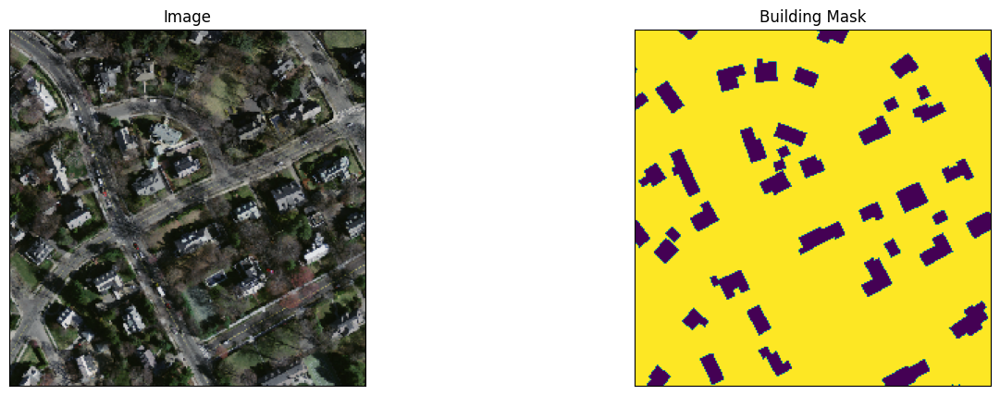

In [ ]:
# load custom modules
from custom_data_loader import Dataset
from data_preprocessing import *

# helper function for data visualisation
def visualise_data_sample(**images):
    """Plot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

dataset = Dataset(x_train_dir, y_train_dir, classes=['building'])

image, mask = dataset[40] # change the index number (0 to 799) to get a different sample out of 800 training samples
visualise_data_sample(
    image=image,
    building_mask=mask[..., 0].squeeze()
)

## D. CNNs for Earth observation Image Segmentation

### D1. What is a CNN?

**A Convolutional Neural Network (CNN) is a type of deep learning algorithm primarily used to process structured arrays of data such as images.** A CNN automatically detects important features without any human supervision, using layers of learning: convolutional layers for filtering data, pooling layers for downsizing, and fully connected layers to predict outcomes. This architecture makes CNNs especially good for tasks like image and video recognition and image classification.

![CNN Network](https://drive.google.com/uc?id=1zGFgSIqlTtuQWRxdwXEXnWYCSebtB_3m)




### D2. Convolution

Convolutional layers are fundamental components of CNN that perform most of the heavy lifting. These layers use filters or kernels to perform convolution operations across the input image, extracting essential features such as edges, textures, and shapes at various levels of abstraction. Each filter generates a feature map that represents the presence of specific features within localized regions of the input. As the network deepens, convolutional layers can capture increasingly complex patterns through the hierarchical composition of learned features. This capability enables CNNs to be highly effective in tasks such as image and video recognition, where understanding spatial hierarchies in the data is crucial. These layers not only reduce the number of parameters compared to fully connected layers but also maintain the spatial relationships within the data, making them efficient for processing images. An example of convolution to generate image interpretations is shown below:

![Convolution](https://poloclub.github.io/cnn-explainer/assets/figures/convlayer_overview_demo.gif)

CNN Visualiser (Image Source): https://poloclub.github.io/cnn-explainer/

#### Resources to Learn CNNs
1. Book - Deep learning with Python - François Chollet (2021)
2. Book - Deep learning with PyTorch - Stevens et al. (2020)
3. Lecture - CS231n: Deep Learning for Computer Vision - http://cs231n.stanford.edu/
4. FastAI - https://docs.fast.ai/

### D3. What is an EDN?

An encoder-decoder network (EDN) of a CNNs is a framework typically used for tasks like image segmentation. It consists of an encoder and a decoder.

**Encoder**: The encoder is a CNN that utilises a series of convolutional and pooling layers to progressively downsample the input, generating multi-scale feature maps (downsized representations of the input images).

**Decoder**: The decoder part then takes these maps and reconstructs the output from this compressed data through a series of upsampling and convolutional layers.

Output: The output is designed to retain critical structural details from the input.

The EDN architecture enables the network to effectively learn mappings from inputs to outputs, which are spatially correlated to the input data, such as in segmentation of images.

A typical EDN for image segmentation ([U-Net](https://link.springer.com/chapter/10.1007/978-3-319-24574-4_28)):

![EDN](https://drive.google.com/uc?id=1Ctzjvg2c9lLu4s1SHS2KidDF3UdvN35O)




### D4. Retreiving an EDN in Segmentation Models PyTorch (SMP)

In [ ]:
# Training a U-Net with CNN called "Mobileone_s1" from Apple.
model = smp.Unet('mobileone_s1',
                 classes=1, # classes = 1 for binary segmentation
                 activation='sigmoid'# the final activation function to generate ouput; sigmoid for binary, softmax for multi-class
                 )
print(model)

Unet(
  (encoder): MobileOne(
    (stage0): MobileOneBlock(
      (se): Identity()
      (activation): ReLU()
      (rbr_conv): ModuleList(
        (0): Sequential(
          (conv): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (rbr_scale): Sequential(
        (conv): Conv2d(3, 64, kernel_size=(1, 1), stride=(2, 2), bias=False)
        (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (stage1): Sequential(
      (0): MobileOneBlock(
        (se): Identity()
        (activation): ReLU()
        (rbr_conv): ModuleList(
          (0): Sequential(
            (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=64, bias=False)
            (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          )
        )
        (rbr_sc

### D5. Accessing CNNs and EDN
The custom module, `model_fetcher`, has a function called `get_model_from_smp` which can be used to retrieve the following encoder-decoder models for semantic segmentation:

**Available EDNs:**\
[`DeepLabV3`, `DeepLabV3Plus`, `FPN`, `Linknet`, `MAnet`, `PAN`, `PSPNet`, `Unet`, `UnetPlusPlus`]

**Usage:**\
`model = get_model_from_smp(EDN, ENCODER, ENCODER_WEIGHTS, len(CLASSES), ACTIVATION)`

**Example:**\
`model = get_model_from_smp('Unet', 'resnet34', 'imagenet', len(['building']), 'sigmoid')`


The following is a list of supported encoders in the SMP.\
`['vgg16', 'vgg19', 'resnet18', 'resnet34', 'resnet50', 'resnet101', 'resnet152', 'resnext50', 'resnext101', 'inceptionv3', 'inceptionresnetv2', 'inceptionv4', 'xception', 'densenet121', 'densenet169', 'densenet201', 'tu-seresnet18', 'seresnet34', 'seresnet50', 'seresnet101', 'seresnet152', 'seresnext50', 'seresnext101', 'senet154', 'mobilenet', 'mobilenet_v2', 'efficientnetb0', 'efficientnetb1', 'efficientnetb2', 'efficientnetb3', 'efficientnetb4', 'efficientnetb5', 'efficientnetb6', 'efficientnetb7']`

Pytorch Image Models (a.k.a. timm) provides additional encoders that can also be passed to the `get_model_from_smp()` function.\
`['timm-skresnet18', 'timm-skresnet34', 'timm-skresnext50_32x4d', 'timm-mobilenetv3_small_100', 'timm-mobilenetv3_large_100', 'dpn68', 'dpn131', 'seresnext101_64x4d', 'timm-resnest14d', 'timm-resnest50d', 'timm-resnest101e','timm-res2next50', 'timm-regnetx_080', 'timm-regnety_080', 'timm-gernet_s', 'timm-gernet_m', 'timm-gernet_l', 'timm-skresnet18', 'timm-skresnet34', 'timm-skresnext50_32x4d', 'mobileone_s0', 'mobileone_s1', 'mobileone_s2', 'mobileone_s3', 'mobileone_s4', 'mit_b0', 'mit_b1', 'mit_b2', 'mit_b3', 'mit_b4', 'mit_b5']`

You can find more information at https://smp.readthedocs.io/en/latest/encoders_timm.html.

In [ ]:
from model_fetcher import *

model = get_model_from_smp('Unet',            # Name of EDN
                           'mobileone_s1',    # Name of CNN
                           None,              # pre-trained weight - default: None; available weights: 'imagenet'
                           len(['building']), # number of classes
                           'sigmoid'          # activation function
                           )
print(model)

Model:  Unet
Unet(
  (encoder): MobileOne(
    (stage0): MobileOneBlock(
      (se): Identity()
      (activation): ReLU()
      (rbr_conv): ModuleList(
        (0): Sequential(
          (conv): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
          (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (rbr_scale): Sequential(
        (conv): Conv2d(3, 64, kernel_size=(1, 1), stride=(2, 2), bias=False)
        (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (stage1): Sequential(
      (0): MobileOneBlock(
        (se): Identity()
        (activation): ReLU()
        (rbr_conv): ModuleList(
          (0): Sequential(
            (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=64, bias=False)
            (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          )
        )
  

### D6. Hyperparameters

#### Loss function

**A loss function quantifies the difference between the predicted outputs and the actual targets in CNNs.** Loss function guides the training process by providing a measure of error that the network needs to minimise. During training, the CNN adjusts its weights and biases to reduce this loss, effectively learning to improve its predictions.

The choice of loss function can significantly impact the performance and convergence of the network, making it a fundamental component in the design of effective CNN architectures. By continuously evaluating and minimising the loss, CNNs can be finely tuned for tasks such as image recognition, segmentation, and more, ensuring that the model's predictions align closely with the real-world data.

Example of converging *Mean Squared Error (MSE)* as a Loss function:

![loss](https://drive.google.com/uc?id=1JPe1BKKcn9daJ5F-4Ya3wgggbR99T8VW)

The `[get_loss]` function from `[model_fetcher]` provides the following loss functions for semantic segmentation that are common for image segmentation and classification:
`['bce_dice_loss', 'bce_jaccard_loss', 'binary_focal_dice_loss', 'binary_focal_jaccard_loss', 'jaccard_loss', 'dice_loss', 'binary_focal_loss', 'binary_crossentropy', 'total_loss']`


#### Optimizers

**An optimizer determines how the network updates its weights based on the data it sees and the loss it computes.** The optimizer adjusts the weights to minimize the loss function, effectively improving the model’s predictions over time.

Common optimizers include SGD (Stochastic Gradient Descent), Adam, and RMSprop, each having unique ways to modulate the weight adjustments either by managing learning rate decay or by adapting the learning rate based on past gradients.

This optimization process impacts the speed and quality of the learning, making the choice of optimizer a key factor in the performance of a CNN on tasks like automated image interpretation including object recognition.
![optimiser](https://editor.analyticsvidhya.com/uploads/121381obtV.gif)

Image source for optimizer: https://www.analyticsvidhya.com/blog/2021/10/a-comprehensive-guide-on-deep-learning-optimizers/

The `[get_optim]` function from `[model_fetcher]` provides the following optimisers to optimise the training and backpropagation of the weights and biases in the deep learning models:
`['Adam', 'SGD', 'RMSprop', 'Adadelta', 'Adagrad', 'Adamax', 'NAdam']`

#### Learning rate

**Learning rate is a hyperparameter that controls the rate at which the model's weights are updated during training.** Learning rate ensures that the network converges efficiently to a minimum of the loss function— for example, too high a learning rate might cause the model to converge too quickly to a suboptimal solution, or it might overshoot the minimum entirely. Conversely, a too-low learning rate can lead the training process to stall, or it might take prohibitively long to converge, getting stuck in local minima. Adaptive learning rate methods, such as Adam or RMSprop, adjust the learning rate dynamically during training, which helps in mitigating the risks of choosing an inappropriate static learning rate, thus optimizing the training process and improving model performance. Some common rates are: `[0.001, 0.0001, 0.00001]`.

You can setup a learning rate scheduler like `Reduce LR on Plateau` to make the model learn at different rates at different iterations.

### D7. Fetching the hyperparameters

In [ ]:
# Getting loss function
loss = get_loss('dice_loss')

# Setting learning rate
LR = 0.0001

# Getting an optimizer
optim = get_optim('Adam', model.parameters(), LR)

# Learning rate scheduler
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, mode='max', factor=0.1, patience=10)
# this scheduler reduces the learning rate by 0.1 if by the end of 10th epoch, the metric is not higher than before

# Setting GPU device ('cuda' for nvidia GPUs; 'mps' for Apple's metal GPUs; 'cpu' if not GPU is available)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# for Macbook M1/M2 GPUs
# DEVICE = torch.device("mps")

Loss Function:  dice_loss
Optimiser:  Adam


### D8. Training an EDN for Building Segmentation

In [ ]:
import os
import torch
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
import segmentation_models_pytorch as smp
from custom_data_loader import Dataset
from model_fetcher import get_model_from_smp, get_optim, get_loss
from data_preprocessing import get_preprocessing

### Helper function to train an EDN with an encoder of CNN
### This function is also saved as model_trainer.py module
def train_edns(model_name, bb, data_type, CLASSES, BATCH_SIZE, EPOCHS, LR, optimiser, loss_func, ckpt_name):
    """
    Prepared by:  Bipul Neupane (geomat.bipul@gmail.com; bneupane@student.unimelb.edu.au)
                  Earth Observation and AI Research Group, The University of Melbourne

    This program trains a specified segmentation model with provided configurations.

    Parameters:
        model_name (str): Name of the model to adapt.
        bb (str): Backbone (encoder CNN) of the model, usually a type of pre-trained encoder.
        data_type (str): Type of data (e.g., 'building-data', 'Mass-small') used to specify directory structure.
        CLASSES (list of str): List of class names for the segmentation task.
        BATCH_SIZE (int): Batch size for training and validation data loaders (how many example you want to give in one bulk).
        EPOCHS (int): Number of training epochs (how many times you want the model to see the dataset).
        LR (float): Learning rate for the optimizer.
        optimiser (str): Name of the optimizer to use.
        loss_func (str): Name of the loss function to use.
        ckpt_name (str): File name to save the model checkpoint.

    Returns:
        None: This function trains the model and saves the best model based on IoU score.
    """
    ENCODER = bb
    ENCODER_WEIGHTS = None
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # tensorBoard writer
    log_directory = './runs/'
    writer = SummaryWriter(comment=f'{log_directory}/{model_name}_{ENCODER}')

    ####### DATASET GENERATOR
    DATA_DIR = './data/' + data_type + '/'
    x_train_dir = os.path.join(DATA_DIR, 'train', 'image') # training image
    x_valid_dir = os.path.join(DATA_DIR, 'val', 'image') # validation image
    y_train_dir = os.path.join(DATA_DIR, 'train', 'label') # training label
    y_valid_dir = os.path.join(DATA_DIR, 'val', 'label') # validation label

    # Getting pre-processing steps for the selected encoder
    preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER)

    # Dataset function below stores the image samples (x) and their corresponding labels (y)
    train_dataset = Dataset(x_train_dir, y_train_dir, classes=CLASSES, preprocessing=get_preprocessing(preprocessing_fn))
    valid_dataset = Dataset(x_valid_dir, y_valid_dir, classes=CLASSES, preprocessing=get_preprocessing(preprocessing_fn))

    # DataLoader function below loads (n) training examples on the fly; n = batch_size
    train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
    valid_dataloader = DataLoader(valid_dataset, batch_size=1, shuffle=False)


    ####### COMPILE MODEL
    # create segmentation model with pretrained encoder
    n_classes = 1 if len(CLASSES) == 1 else (len(CLASSES) + 1)  # case for binary and multiclass segmentation
    ACTIVATION = 'sigmoid' if n_classes == 1 else 'softmax'

    # fetching the model
    model = get_model_from_smp(model_name, ENCODER, ENCODER_WEIGHTS, len(CLASSES), ACTIVATION)

    # model_params needed for optimiser
    model_params=model.parameters()

    # calculate number of parameters of the model
    params = sum(p.numel() for p in model.parameters())


    ####### PRINTING SOME DETAILS
    print("Encoder: ", ENCODER)
    print("Dataset: ", data_type)
    print("Network params: ", params)


    ####### METRICS AND HYPERPARAMETER SETUP
    metrics = [
        smp.utils.metrics.Precision(threshold=0.5), # threshold=0.5 for sigmoid, None for softmax
        smp.utils.metrics.Recall(threshold=0.5),
        smp.utils.metrics.IoU(threshold=0.5),
        smp.utils.metrics.Fscore(threshold=0.5)
    ]
    loss = get_loss(loss_func)
    optim = get_optim(optimiser, model_params, LR)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'max')
    max_score = 0

    ####### SETUP TRAINING EPOCH
    train_epoch = smp.utils.train.TrainEpoch(
        model,
        loss=loss,
        metrics=metrics,
        optimizer=optim,
        device=DEVICE,
        verbose=True,
    )

    ####### SETUP VALIDATION EPOCH
    valid_epoch = smp.utils.train.ValidEpoch(
        model,
        loss=loss,
        metrics=metrics,
        device=DEVICE,
        verbose=True,
    )

    ####### TRAINING AND VALIDATION LOOP
    for i in range(EPOCHS):
        print('\nEpoch: {}/{}'.format(i+1, EPOCHS))
        train_logs = train_epoch.run(train_dataloader)
        valid_logs = valid_epoch.run(valid_dataloader)

        # log the loss to TensorBoard
        writer.add_scalar('Loss/Train', train_logs['dice_loss'], i)
        writer.add_scalar('Loss/Valid', valid_logs['dice_loss'], i)

        # log the IoU and F1 score to TensorBoard
        writer.add_scalar('Accuracy/Train', train_logs['iou_score'], i)
        writer.add_scalar('Accuracy/Valid', valid_logs['iou_score'], i)
        writer.add_scalar('Accuracy/Train', train_logs['fscore'], i)
        writer.add_scalar('Accuracy/Valid', valid_logs['fscore'], i)

        # print the final loss and metrics in validation data after each epoch
        print("Loss: {:.3f}, Precision: {:.3f}, Recall: {:.3f}, IoU: {:.3f}, F1: {:.3f}".format(
            list(valid_logs.items())[0][1],
            list(valid_logs.items())[1][1],
            list(valid_logs.items())[2][1],
            list(valid_logs.items())[3][1],
            list(valid_logs.items())[4][1])
        )

        # saving model only when the IoU score from current epoch is higher than the previous IoU score
        if max_score < valid_logs['iou_score']:
          max_score = valid_logs['iou_score']
          torch.save({'model_state_dict': model.state_dict()}, ckpt_name)
          print('Model saved!')
          scheduler.step(max_score)

    # close the TensorBoard writer after the loop ends to ensure all data is flushed to disk
    writer.close()
    print("Training completed.")

In [ ]:
## Training for 5 epochs during the workshop

edn_name = 'Unet'
cnn_name = 'mobileone_s1'
data_type = 'Mass-small'
CLASSES = ['building']
BATCH_SIZE = 4
EPOCHS = 5 # <-- change the number of epoch here
LR = 0.0001
optim = 'RMSprop'
loss = 'dice_loss'
ckpt_name = './trained_models/'+edn_name+'-'+cnn_name+'-'+data_type+'-'+str(EPOCHS)+'ep'+'-'+optim+'-'+loss+'.pth' #ckpt: model checkpoint

train_edns(edn_name, cnn_name, data_type, CLASSES, BATCH_SIZE, EPOCHS, LR, optim, loss, ckpt_name)

In [ ]:
## Training for 50 epochs
# Do not run this cell during the workshop.

edn_name = 'Unet'
cnn_name = 'mobileone_s1'
data_type = 'Mass-small'
CLASSES = ['building']
BATCH_SIZE = 4
EPOCHS = 50 # <-- change the number of epoch here
LR = 0.0001
optim = 'RMSprop'
loss = 'dice_loss'
ckpt_name = './trained_models/'+edn_name+'-'+cnn_name+'-'+data_type+'-'+str(EPOCHS)+'ep'+'-'+optim+'-'+loss+'.pth'

train_edns(edn_name, cnn_name, data_type, CLASSES, BATCH_SIZE, EPOCHS, LR, optim, loss, ckpt_name)

Model:  Unet
Encoder:  mobileone_s1
Dataset:  Mass-small
Network params:  9147345
Loss Function:  dice_loss
Optimiser:  RMSprop

Epoch: 1/50
valid: 100%|██████████| 100/100 [00:04<00:00, 24.57it/s, dice_loss - 0.1183, precision - 0.9498, recall - 0.9348, iou_score - 0.8928, fscore - 0.941]
Loss: 0.118, Precision: 0.950, Recall: 0.935, IoU: 0.893, F1: 0.941
Model saved!

Epoch: 2/50
valid: 100%|██████████| 100/100 [00:03<00:00, 28.89it/s, dice_loss - 0.08734, precision - 0.9437, recall - 0.9497, iou_score - 0.9005, fscore - 0.9453]
Loss: 0.087, Precision: 0.944, Recall: 0.950, IoU: 0.901, F1: 0.945
Model saved!

Epoch: 3/50
valid: 100%|██████████| 100/100 [00:04<00:00, 23.70it/s, dice_loss - 0.06329, precision - 0.9382, recall - 0.9726, iou_score - 0.9155, fscore - 0.9543]
Loss: 0.063, Precision: 0.938, Recall: 0.973, IoU: 0.916, F1: 0.954
Model saved!

Epoch: 4/50
valid: 100%|██████████| 100/100 [00:03<00:00, 28.08it/s, dice_loss - 0.05729, precision - 0.9431, recall - 0.9668, iou_scor

### D9. Visualising the loss and metric graphs

In [ ]:
# To visulaise the loss and metrics in graphs, we use TensorBoard libary

# loading tensorboard
%load_ext tensorboard

# using magic command called "%tensorboard" in Google Colab
%tensorboard --logdir runs

### D10. Evaluating a saved model

In [ ]:
from model_evaluate import evaluate_edns

saved_ckpt = './trained_models/Unet-mobileone_s1-Mass-small-50ep-RMSprop-dice_loss.pth'

edn = 'Unet'
bb = 'mobileone_s1'
data_type = 'Mass-small'
loss_func = 'dice_loss'

evaluate_edns(saved_ckpt, edn, bb, data_type, loss_func)


********************************************************************************
********************************************************************************
Model:  Unet
Loss Function:  dice_loss
Encoder:  mobileone_s1
Checkpoint:  ./trained_models/Unet-mobileone_s1-Mass-small-50ep-RMSprop-dice_loss.pth
Validated on:  Mass-small
Net Params:  9147345
valid: 100%|██████████| 100/100 [00:04<00:00, 20.31it/s, dice_loss - 0.03868, precision - 0.9497, recall - 0.9747, iou_score - 0.9279, fscore - 0.9614]
Loss: 0.039, P: 0.950, R: 0.975, IoU: 0.928, F1: 0.961
********************************************************************************
********************************************************************************


**Interpretation**

*Loss:* lower loss is better and loss lower than 0.05 is generally considered "a well trained model".

*Other metrics:* Higher metric scores are better. IoU and F1 scores are more reliable metrics than Recall and Precision.

*Net Params:* 9.147 millions is a lightweight model for todays GPU capacity


### D11. Visualising Ouptuts

********************************************************************************
********************************************************************************
Model:  Unet
Encoder:  mobileone_s1


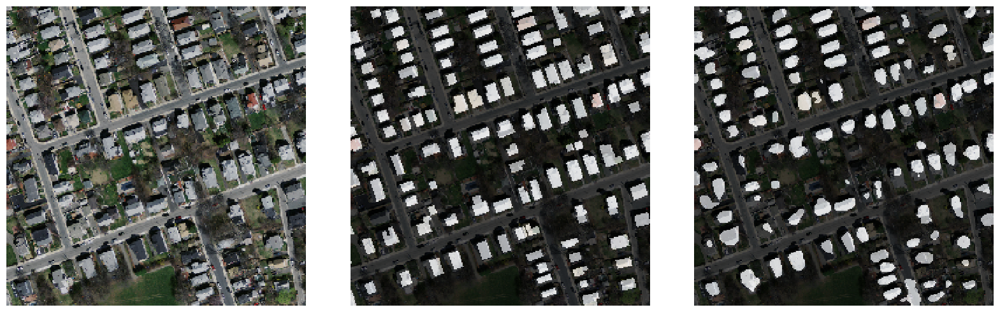

********************************************************************************
********************************************************************************


In [ ]:
from model_prediction_visualiser import visualise_predictions

saved_ckpt = './trained_models/Unet-mobileone_s1-Mass-small-50ep-RMSprop-dice_loss.pth'
edn = 'Unet'
bb = 'mobileone_s1'
data_type = 'Mass-small'
loss_func = 'dice_loss'
image_idx = 15 # index 14 means 14th image of "valid_dataset"

visualise_predictions(saved_ckpt, edn, bb, data_type, loss_func, image_idx)

### D12. Potential Experiments
To find out the optimal model and hyperparameters, a large number of experiments should be conducted. To be efficient, we propose:
* Train a Deeplabv3 EDN with Google's EfficientNet-lite0 CNN (`tu-tf_efficientnet_lite0`). Use Jaccard's loss and Adam optimizer.
* Compare the results.

## E. Addressing Small Data Problem

**What is small data problem?**

CNNs are data-hungry models. There is no rule of thumb on how many images it needs to train a highly accurate model. The generic datasets that are used to benchmark the CNNs such as ImageNet and COCO datasets have millioins of image samples. In Earth observation, the collection of such large amount of images and labeling them is a challenging task. Therefore, the Earth observation datasets to train CNNs are either small or large but with noisy labels. This forces the practisioners to work with small data, which is called a "small dataset problem".

In this section, we will address the small dataset problem with three existing solutions:
1. Transfer Learning
2. Data augmentation
3. API services (Nearmap) to auto-collect the training images

### E1. Transfer Learning - Domain Adaptation from a pre-trained model

**What is Transfer Learning?**

Transfer learning of convolutional neural networks (CNNs) involves leveraging a model pre-trained on a large dataset, typically on a general task like image recognition, and adapting it to a more specific task with potentially less data. This approach allows for significant improvements in learning efficiency and prediction accuracy, particularly in domains where collecting a large labeled dataset is challenging. By fine-tuning the pre-trained network's weights on the new task, transfer learning exploits previously learned features, speeding up the training process and enhancing performance even with limited data.

**Datasets in this Section**

*Source Dataset*: The "source dataset" refers to the large, often diverse dataset initially used to train the model. This dataset is typically generic, covering a broad range of classes and examples to ensure that the model learns a wide array of features. It can also be a larger dataset with few specific classes. In this tutorial, we use revised version of `WHU Building dataset` from the following paper: https://isprs-annals.copernicus.org/articles/X-4-W3-2022/173/2022/isprs-annals-X-4-W3-2022-173-2022.pdf

*Target dataset*: The "target dataset" is specific to the task or domain of interest and usually smaller. It is used to fine-tune the pre-trained model so that it adapts to the nuances and specific characteristics of the new application. By training on the source dataset first and then fine-tuning on the target dataset, the model leverages previously learned knowledge to achieve higher performance and quicker convergence on the specific task. In this tutorial, we use the same `Mass-small` dataset from the prevous section.

In [ ]:
# The function "adapt_edns" inside "model_adapt_transfer_learning.py" allows the domain adaptaion of an image segmentation network.
# Do not run this cell in the workshop

from model_adapt_transfer_learning import adapt_edns

edn_name = 'Unet'
enc_name = 'mobileone_s1'
weights_path = './trained_models/Unetmobileone_s1-WHU-256-50ep-RMSprop-dice_loss.pth'
data_type = 'Mass-small'
CLASSES = ['building']
BATCH_SIZE = 4
EPOCHS = 50
LR = 0.0001
optim = 'RMSprop'
loss = 'dice_loss'
ckpt_name = './trained_models/'+edn_name+'-'+enc_name+'-adapt-WHU-to-'+data_type+'-'+str(EPOCHS)+'ep'+'-'+optim+'-'+loss+'.pth'

adapt_edns(edn_name, enc_name, weights_path, data_type, CLASSES, BATCH_SIZE, EPOCHS, LR, optim, loss, ckpt_name)


Model:  Unet
Training model  Unet
Encoder:  mobileone_s1
Network params 9147345
Loss Function:  dice_loss
Optimiser:  RMSprop

Epoch: 1/50
valid: 100%|██████████| 100/100 [00:04<00:00, 21.22it/s, dice_loss - 0.03766, precision - 0.9528, recall - 0.9731, iou_score - 0.9296, fscore - 0.9624]
Loss: 0.038, Precision: 0.953, Recall: 0.973, IoU: 0.930, F1: 0.962, LR: 0.0001
Model saved!

Epoch: 2/50
valid: 100%|██████████| 100/100 [00:04<00:00, 22.19it/s, dice_loss - 0.03705, precision - 0.9561, recall - 0.9707, iou_score - 0.9308, fscore - 0.963]
Loss: 0.037, Precision: 0.956, Recall: 0.971, IoU: 0.931, F1: 0.963, LR: 0.0001
Model saved!

Epoch: 3/50
valid: 100%|██████████| 100/100 [00:04<00:00, 23.97it/s, dice_loss - 0.04197, precision - 0.9589, recall - 0.9588, iou_score - 0.9233, fscore - 0.9581]
Loss: 0.042, Precision: 0.959, Recall: 0.959, IoU: 0.923, F1: 0.958, LR: 0.0001

Epoch: 4/50
valid: 100%|██████████| 100/100 [00:04<00:00, 20.31it/s, dice_loss - 0.03741, precision - 0.9596, rec

In [ ]:
# Using model_evaluate module to evaluate the EDN
from model_evaluate import evaluate_edns

saved_ckpt = './trained_models/Unet-mobileone_s1-adapt-WHU-to-Mass-small-50ep-RMSprop-dice_loss.pth'

edn = 'Unet'
bb = 'mobileone_s1'
data_type = 'Mass-small'
loss_func = 'dice_loss'

evaluate_edns(saved_ckpt, edn, bb, data_type, loss_func)

********************************************************************************
********************************************************************************
Model:  Unet
Loss Function:  dice_loss
Encoder:  mobileone_s1
Checkpoint:  ./trained_models/Unet-mobileone_s1-adapt-WHU-to-Mass-small-50ep-RMSprop-dice_loss.pth
Validated on:  Mass-small
Net Params:  9147345
valid: 100%|██████████| 100/100 [00:04<00:00, 20.53it/s, dice_loss - 0.03462, precision - 0.9575, recall - 0.9741, iou_score - 0.935, fscore - 0.9654]
Loss: 0.035, P: 0.958, R: 0.974, IoU: 0.935, F1: 0.965
********************************************************************************
********************************************************************************


********************************************************************************
********************************************************************************
Model:  Unet
Encoder:  mobileone_s1


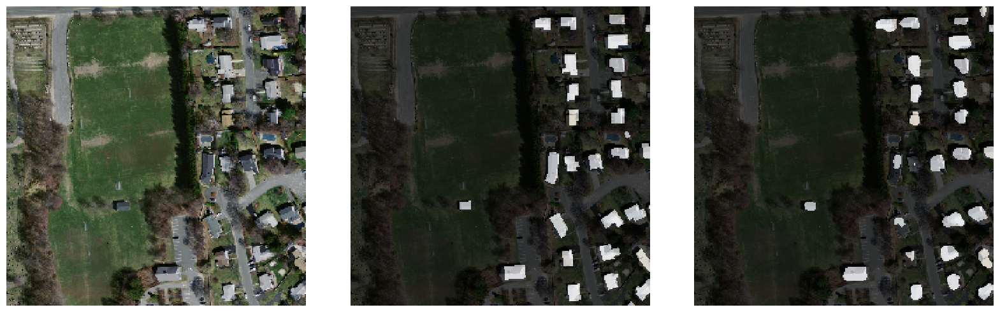

********************************************************************************
********************************************************************************


In [ ]:
# Using "model_prediction_visualiser" module to visualise the segmentation outputs
from model_prediction_visualiser import visualise_predictions

saved_ckpt = './trained_models/Unet-mobileone_s1-adapt-WHU-to-Mass-small-50ep-RMSprop-dice_loss.pth'
edn = 'Unet'
bb = 'mobileone_s1'
data_type = 'Mass-small'
loss_func = 'dice_loss'
image_idx = 14

visualise_predictions(saved_ckpt, edn, bb, data_type, loss_func, image_idx)

Difference between the Unet-mobileone-s1 trained only on Mass-small data and Domain adaptation between two datasets:

**Trained only on Mass-small data-**
Loss: 0.039, P: 0.950, R: 0.975, IoU: 0.928, F1: 0.961

**Trained with Domain adaptation-**
Loss: 0.035, P: 0.958, R: 0.974, IoU: 0.935, F1: 0.965

#### Potential Experiments
To find out the optimal model and hyperparameters, a large number of experiments should be conducted. To be efficient, we propose:
* Train the same model using other Jaccard loss and Adam optimiser.
* Compare the results.

### E2. Data Augmentation
Data augmentation is a technique used to enhance the performance of machine/deep learning models by artificially increasing the size and diversity of training datasets. The primary use of these augmentations is to increase the amount of data and prevent model overfitting. This method involves applying a series of transformations to the existing data to create new, varied instances that simulate potential real-world variations. These transformations can include rotations, translations, scaling, flipping, noise injection, and changes in brightness or contrast. The goal is to make the model robust to changes it might encounter in real applications, thereby improving its generalisability and reducing the likelihood of overfitting.

![augmentation](https://drive.google.com/uc?id=1uJlCmpJ54YbBSDo6G5fllNXKYWCAb9eJ)

These transforms can be easily applied with a python library called Albumentations. Link to Albumentations: https://github.com/albumentations-team/albumentations

For more details, have a read:

[The Effectiveness of Data Augmentation in Image Classification using Deep Learning](http://cs231n.stanford.edu/reports/2017/pdfs/300.pdf)

As our dataset is small we may apply a large number of different augmentations. In this tutorial, we have put the data augmentation functions in data_preprocessing.py. This module includes the following augmentations:

    - Horizontal flipping
    - Scaling, shifting, and rotating
    - Padding and random cropping to a fixed size
    - Adding Gaussian noise
    - Applying perspective transformations
    - Adjusting contrast using various methods
    - Adjusting sharpness or blurring

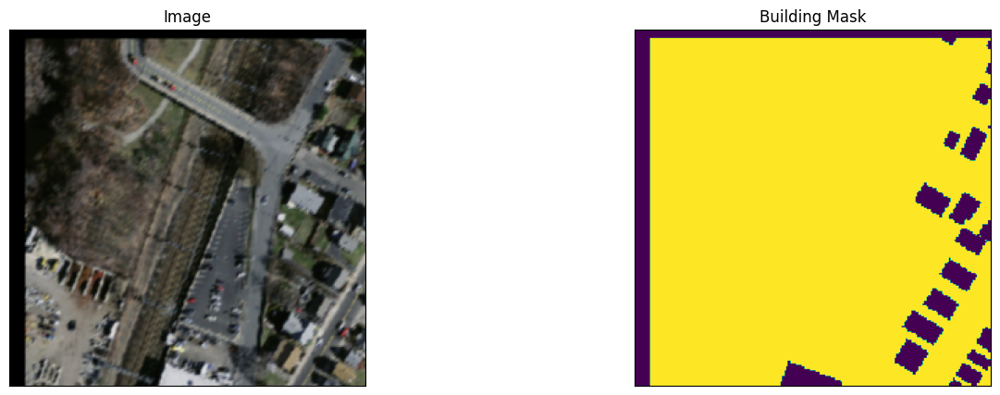

In [ ]:
from data_preprocessing import *
from custom_data_loader import Dataset

# path of dataset
DATA_DIR = './data/Mass-small/'

# collect image(x) and label(y) of train subset
x_train_dir = os.path.join(DATA_DIR, 'train', 'image')
y_train_dir = os.path.join(DATA_DIR, 'train', 'label')

# collect image(x) and label(y) of val subset
x_valid_dir = os.path.join(DATA_DIR, 'val', 'image')
y_valid_dir = os.path.join(DATA_DIR, 'val', 'label')

# collect image(x) and label(y) of test subset
x_test_dir = os.path.join(DATA_DIR, 'test', 'image')
y_test_dir = os.path.join(DATA_DIR, 'test', 'label')

# helper function for data visualisation
def visualise_data_sample(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

# Lets look at augmented data we have
dataset = Dataset(x_train_dir, y_train_dir, classes=['building'], augmentation=get_training_augmentation())

image, mask = dataset[50] # change the index number to get a different sample
visualise_data_sample(
    image=image,
    building_mask=mask[..., 0].squeeze()
)

In [ ]:
# Setting-up augmentation in during training and validation
# Replace the train_dataset and valid_dataset variables in the train_edn
# function with the lines below and re-train the U-Net with MobileOne-s1.

preprocessing_fn = smp.encoders.get_preprocessing_fn('mobileone_s1')
CLASSES = ['building']

train_dataset = Dataset(
    x_train_dir,
    y_train_dir,
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
    classes=CLASSES,
)

valid_dataset = Dataset(
    x_valid_dir,
    y_valid_dir,
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
    classes=CLASSES,
)

In [ ]:
# Run this cell at home
from model_trainer_with_augmentation import train_edns_with_augmentation

edn_name = 'Unet'
cnn_name = 'mobileone_s1'
data_type = 'Mass-small'
CLASSES = ['building']
BATCH_SIZE = 4
EPOCHS = 50 # <-- change the number of epoch here
LR = 0.0001
optim = 'RMSprop'
loss = 'dice_loss'
ckpt_name = './trained_models/'+edn_name+'-'+cnn_name+'-augment-'+data_type+'-'+str(EPOCHS)+'ep'+'-'+optim+'-'+loss+'.pth'

train_edns_with_augmentation(edn_name, cnn_name, data_type, CLASSES, BATCH_SIZE, EPOCHS, LR, optim, loss, ckpt_name)

Model:  Unet
Encoder:  mobileone_s1
Dataset:  Mass-small
Network params:  9147345
Loss Function:  dice_loss
Optimiser:  RMSprop

Epoch: 1/50
valid: 100%|██████████| 100/100 [00:48<00:00,  2.04it/s, dice_loss - 0.1126, precision - 0.8992, recall - 0.962, iou_score - 0.868, fscore - 0.9264]
Loss: 0.113, Precision: 0.899, Recall: 0.962, IoU: 0.868, F1: 0.926
Model saved!

Epoch: 2/50
valid: 100%|██████████| 100/100 [00:05<00:00, 18.99it/s, dice_loss - 0.08493, precision - 0.9096, recall - 0.9651, iou_score - 0.8816, fscore - 0.9347]
Loss: 0.085, Precision: 0.910, Recall: 0.965, IoU: 0.882, F1: 0.935
Model saved!

Epoch: 3/50
valid: 100%|██████████| 100/100 [00:05<00:00, 18.92it/s, dice_loss - 0.07618, precision - 0.9035, recall - 0.972, iou_score - 0.8808, fscore - 0.9338]
Loss: 0.076, Precision: 0.904, Recall: 0.972, IoU: 0.881, F1: 0.934

Epoch: 4/50
valid: 100%|██████████| 100/100 [00:07<00:00, 14.13it/s, dice_loss - 0.0694, precision - 0.917, recall - 0.9613, iou_score - 0.8857, fscor

In [ ]:
from model_evaluate import evaluate_edns

saved_ckpt = './trained_models/Unet-mobileone_s1-augment-Mass-small-50ep-RMSprop-dice_loss.pth'

edn = 'Unet'
bb = 'mobileone_s1'
data_type = 'Mass-small'
loss_func = 'dice_loss'

evaluate_edns(saved_ckpt, edn, bb, data_type, loss_func)

********************************************************************************
********************************************************************************
Model:  Unet
Loss Function:  dice_loss
Encoder:  mobileone_s1
Checkpoint:  ./trained_models/Unet-mobileone_s1-augment-Mass-small-50ep-RMSprop-dice_loss.pth
Validated on:  Mass-small
Net Params:  9147345
valid: 100%|██████████| 100/100 [00:04<00:00, 21.61it/s, dice_loss - 0.04664, precision - 0.9307, recall - 0.9798, iou_score - 0.9141, fscore - 0.9536]
Loss: 0.047, P: 0.931, R: 0.980, IoU: 0.914, F1: 0.954
********************************************************************************
********************************************************************************


Difference between the Unet-mobileone-s1 trained only on the Mass-small data and on the augmented dataset:

**Trained only on Mass-small data-**
Loss: 0.039, P: 0.950, R: 0.975, IoU: 0.928, F1: 0.961

**Trained on the Augmented Dataset-**
Loss: 0.047, P: 0.931, R: 0.980, IoU: 0.914, F1: 0.954

The augmentation of the dataset did not improve the accuracy of the model. there could be several reasons behind this. Here are some common reasons and considerations.

**Factors affecting the results from Augmentation**:

1. *Inappropriate Augmentations*: The type of augmentations applied might not be suitable for your specific task. For example, overly aggressive transformations (e.g., extreme rotations, scaling, or color modifications) might distort the data too much, leading to a loss of important features that the model needs to learn from.

2. *Increased Complexity*: Data augmentation effectively increases the diversity and complexity of the training data. This can be beneficial for generalization but might require more training epochs or a larger dataset to see the benefits. If the model has not been trained long enough after augmentation, it might not yet have adapted to this increased complexity.

3. *Model Capacity*: With more varied data, the model might need to be more complex to learn effectively. If your U-Net model is relatively simple, it might not have enough capacity to capture the additional complexity introduced by the augmentations.

4. *Overfitting on Non-Augmented Data*: If the model performed better on the non-augmented data, it might have been overfitting to the limited nuances of that dataset. Although this can lead to higher scores on similar test sets, it generally performs worse on new, unseen data. Augmentation aims to prevent such overfitting by introducing more variability, but this can initially decrease performance if the model or training regimen isn't adequately adjusted.

5. *Evaluation Metrics and Dataset Split*: The choice of metrics and the nature of the test dataset can also impact perceived performance. Ensure that the metrics used are appropriate for evaluating the type of changes introduced by the augmentations and that the test set is representative of the conditions under which the model is expected to operate.

6. *Learning Rate and Optimization*: Sometimes, the introduction of augmented data requires adjustments in the learning rate or other optimization parameters. The learning dynamics change with more varied data, and fine-tuning these parameters can help improve training outcomes.

**Possible Steps to Address the Issue:**

1. *Experiment with Different Augmentations*: Reduce the intensity or change the types of augmentations to see how they affect performance.

2. *Increase Training Duration*: Given the added complexity, consider increasing the number of epochs or the amount of training data.

3. *Adjust Model Architecture*: Explore whether increasing the capacity of your U-Net model (e.g., more layers, more filters) helps.

4. *Cross-Validation*: Use cross-validation to ensure that your evaluation is robust and that the model generalizes well across different subsets of data.

5. *Hyperparameter Tuning*: Experiment with different learning rates, batch sizes, and other relevant hyperparameters.

By considering these aspects, you can better understand how data augmentation impacts your model's learning process and make informed adjustments to improve performance.

#### Potential Experiments
1. Try out some other Augmentation techniques that are available in the `albumentation` library. To do this, you will have to edit the `data_preprocessing.py` module, where you can remove, add, or edit some of the transformations inside the `get_training_augmentation` function.

2. Train a larger model (U-Net with EfficientNetv2-M) to fit to the provided larger dataset after the augmentation.

3. Compare the results after re-training with other Augmentation techniques.

In [ ]:
# To visulaise the loss and metrics in graphs, we use TensorBoard libary

# loading tensorboard
%load_ext tensorboard

# using magic command called "%tensorboard" in Google Colab
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

### E3. Automated data pipeline with API services (Nearmap)

**To do at home**

In this section, we will write Python scipts to collect building footprint image and labels from the Open data provided by the City of Melbourne i.e. 2020 Building Footprints: https://data.melbourne.vic.gov.au/explore/dataset/2020-building-footprints/information/

In [ ]:
# this section requires the following python library that is not installed by default in Google Colab
!pip install pygeotile

  Preparing metadata (setup.py) ... done
  Created wheel for pygeotile: filename=pyGeoTile-1.0.6-py3-none-any.whl size=4873 sha256=08aa633ed2884c99599f1c240ec441dab90781845678c2f521706282563396ed
  Stored in directory: /root/.cache/pip/wheels/02/4d/7c/e01f952fbc94a1c610404897fe4ff7c3403e61597bd8d85813
Successfully built pygeotile


In [ ]:
import geopandas
import os
from pygeotile.point import Point
from pygeotile.tile import Tile
from pygeotile.meta import TILE_SIZE
import requests
from PIL import Image
import random
from shutil import copy2
import json
import matplotlib.pyplot as plt
import fiona

#### Reading Building Polygons from a Shapefile

In [ ]:
# path to an edited (noise removed) version of 2020 Building footprints data
polygons_paths = [os.path.join('./', 'CityPolygon', 'polygons-edited.shp')] # you can put multiple polygons in this array, separated with a comma

# check zoom levels and resolution at: https://help.nearmap.com/kb/articles/293-zoom-and-x-y-values-in-tms
zoom = 18

# we used zoom level 18 i.e. that corresponds to pixel resolution of 0.593cm
res = 0.593

# give a custom name to the dataset we will prepare
data_name = "MELB-zoom18"

# path to save the gathered tiles
out_data_path = os.path.join('./', 'Gathered_tiles', data_name)
out_image_path = os.path.join('./', 'Gathered_tiles', data_name, 'image')
out_label_path = os.path.join('./', 'Gathered_tiles', data_name, 'label')

# list of output paths
out_paths = [out_data_path, out_image_path, out_label_path]

# function to create directories if they don't exist
def create_directory_if_not_exists(out_paths):
    if not os.path.exists(out_paths):
        os.makedirs(out_paths)
        print(f"Directory '{out_paths}' was created.")
    else:
        print(f"Directory '{out_paths}' already exists.")

# Apply the function to each path
for path in out_paths:
    create_directory_if_not_exists(path)

Directory './Gathered_tiles/MELB-zoom18' already exists.
Directory './Gathered_tiles/MELB-zoom18/image' was created.
Directory './Gathered_tiles/MELB-zoom18/label' was created.


In [ ]:
# reading the 2020 Building footprints data with geopandas library
bf_gdf = 0
for i, polygons_path in enumerate(polygons_paths):
    if isinstance(bf_gdf, geopandas.geodataframe.GeoDataFrame):
        tmp_bf_gdf = geopandas.read_file(polygons_path)
        tmp_bf_gdf['file_id'] = i
        bf_gdf = bf_gdf.append(tmp_bf_gdf, ignore_index=True)
    else:
        bf_gdf = geopandas.read_file(polygons_path)
        bf_gdf['file_id'] = i

bf_gdf['bounds'] = bf_gdf.apply(lambda row: row['geometry'].bounds, axis=1)
bf_gdf['centroid'] = bf_gdf.apply(lambda row: row['geometry'].centroid, axis=1)
bf_gdf['i'] = bf_gdf.index
bf_gdf.head()

,structure_,property_i,footprint_,roof_type,tier,footprin_2,footprin_3,structur_2,structur_3,footprin_4,structur_4,geometry,file_id,bounds,centroid,i
0,810107.0,107427.0,Structure,Flat,5.0,49.5,38.5,53.5,38.5,11.0,11.0,"POLYGON ((16135483.844 -4549103.394, 16135485....",0,"(16135389.574696148, -4549120.268332956, 16135...",POINT (16135473.361 -4549073.033),0
1,802367.0,522663.0,Structure,Flat,1.0,34.5,31.0,34.5,31.0,3.5,3.5,"POLYGON ((16138176.067 -4550927.671, 16138170....",0,"(16138170.944905015, -4550927.670514836, 16138...",POINT (16138172.921 -4550924.624),1
2,813698.0,102018.0,Structure,Flat,1.0,19.0,13.0,19.0,13.0,6.0,6.0,"POLYGON ((16139869.094 -4555572.209, 16139856....",0,"(16139856.960900737, -4555572.208844953, 16139...",POINT (16139863.879 -4555569.314),2
3,808172.0,104783.0,Structure,Flat,1.0,33.0,17.5,37.0,17.5,15.5,15.5,"POLYGON ((16137636.471 -4552838.361, 16137631....",0,"(16137606.577658772, -4552845.397755816, 16137...",POINT (16137628.840 -4552821.538),3
4,812667.0,109953.0,Structure,Flat,1.0,30.5,17.5,30.5,17.5,13.5,13.0,"POLYGON ((16137659.427 -4552837.755, 16137638....",0,"(16137635.847318998, -4552845.001616932, 16137...",POINT (16137646.907 -4552832.180),4


#### Calling Nearmap Tile API

In [ ]:
"""
You need an API key to acess the images:
https://api.nearmap.com/tiles/v3/{tileResourceType}/{z}/{x}/{y}.{format}?apikey={YOUR_API_KEY}
"""

existing_elements = set([])
employed_tiles = {}
for i, row in bf_gdf.iterrows():
    geom = row.geometry
    bound = row.bounds
    centroid = row.centroid
    file_id = row.file_id
    # if file_id==0:
    #     continue
    zoom = zoom  # meters in Spherical Mercator EPSG:900913
    point = Point.from_meters(centroid.x, centroid.y)
    print(point)
    tile = Tile.for_point(point, zoom)
    if (tile.google[0], tile.google[1]) not in existing_elements:
        path = "https://api.nearmap.com/tiles/v3/Vert/{zoom_level}/{x}/{y}.png"
        path = path.format(zoom_level=zoom,
                   x=tile.google[0],
                   y=tile.google[1])
        params = {
            'apikey': 'put your API key here' # <-- put your API key here
        }
        response = requests.get(path, params=params)
        print(response)
        if response.status_code == 200:
            with open(os.path.join('Gathered_tiles', data_name,'image', str(i)+'.png'), 'wb') as f:
                f.write(response.content)

            existing_elements.add((tile.google[0], tile.google[1]))
            employed_tiles[str(i)] = {'tile': (tile.google[0], tile.google[1], zoom), 'dataset_identifier': file_id}

Streaming output truncated to the last 5000 lines.
Point(latitude=-37.815599396977916, longitude=144.93831057726598)
Point(latitude=-37.81533009663785, longitude=144.93815603649492)
Point(latitude=-37.81570617305308, longitude=144.93825625818351)
Point(latitude=-37.815475201325846, longitude=144.9383737118557)
Point(latitude=-37.815063732119604, longitude=144.9380478548169)
Point(latitude=-37.816019789278016, longitude=144.93863016598198)
Point(latitude=-37.81428551625644, longitude=144.94019097002024)
Point(latitude=-37.81428644821331, longitude=144.9401933037584)
Point(latitude=-37.814274057502054, longitude=144.9401929495479)
Point(latitude=-37.814442202027315, longitude=144.94017831754041)
Point(latitude=-37.814227780223945, longitude=144.94016373995677)
Point(latitude=-37.81543164056834, longitude=144.93925179272497)
Point(latitude=-37.814688274467244, longitude=144.9396866395313)
Point(latitude=-37.81495222663292, longitude=144.9398411840297)
Point(latitude=-37.814499653888404, l

In [ ]:
with open(os.path.join('Gathered_tiles', data_name, 'employed_tiles.json'), 'w') as f:
    json.dump(employed_tiles, f)

#### Making the mask/label dataset

In [ ]:
from autorasterize import rasterize

for k, obj in employed_tiles.items():
    tile = obj['tile']
    file_id = obj['dataset_identifier']
    google_x, google_y, zoom = tile # format: 119098, 82116, 17
    pixel_x_west, pixel_y_north = google_x * TILE_SIZE, google_y * TILE_SIZE
    pixel_x_east, pixel_y_south = (google_x + 1) * TILE_SIZE, (google_y + 1) * TILE_SIZE
    sw = Point.from_pixel(pixel_x_west, pixel_y_south, zoom).meters
    ne = Point.from_pixel(pixel_x_east, pixel_y_north, zoom).meters
    rasterize(polygons_paths[file_id], os.path.join('Gathered_tiles', data_name,'label', str(k)+'.png') , sw[0], sw[1], ne[0], ne[1], 1.19)

rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing based on reference raster
rasterizing 

#### Split Train and Test Subset

In [ ]:
rgb_files = [f for f in os.listdir(out_image_path) if os.path.isfile(os.path.join(out_image_path, f))]
random.shuffle(rgb_files)
files = {}
number_of_all_files = len(rgb_files)
number_of_train_files = int(number_of_all_files*0.7)
files['train'] = rgb_files[:number_of_train_files]
files['test'] = rgb_files[number_of_train_files:]

# path to save the splited data
split_data_path = os.path.join('./', 'data', data_name)
train_image_path = os.path.join('./', 'data', data_name, 'train', 'image')
train_label_path = os.path.join('./', 'data', data_name, 'train', 'label')
test_image_path = os.path.join('./', 'data', data_name, 'test', 'image')
test_label_path = os.path.join('./', 'data', data_name, 'test', 'label')

# list of output paths
out_split_paths = [split_data_path, train_image_path, train_label_path, test_image_path, test_label_path]

# function to create directories if they don't exist
def create_directory_if_not_exists(out_split_paths):
    if not os.path.exists(out_split_paths):
        os.makedirs(out_split_paths)
        print(f"Directory '{out_split_paths}' was created.")
    else:
        print(f"Directory '{out_split_paths}' already exists.")

# Apply the function to each path
for path in out_split_paths:
    create_directory_if_not_exists(path)

file_map_path = "./data/" + data_name + "/file_map.json"

# ensure the directory exists
os.makedirs(os.path.dirname(file_map_path), exist_ok=True)

with open(file_map_path, 'w') as f:
  print("dumping")
  json.dump(files, f)


Directory './data/MELB-zoom18' already exists.
Directory './data/MELB-zoom18/train/image' already exists.
Directory './data/MELB-zoom18/train/label' already exists.
Directory './data/MELB-zoom18/test/image' already exists.
Directory './data/MELB-zoom18/test/label' already exists.
dumping


In [ ]:
for k, list_of_files in files.items():
    counter = 0
    print("preparing ", k)
    out_path = os.path.join('./', 'data', data_name, k)
    for file in list_of_files:
        copy2(os.path.join(out_image_path, file), os.path.join(out_path, 'image', str(counter) + '.png'))
        copy2(os.path.join('Gathered_tiles', data_name, 'label', file), os.path.join(out_path, 'label', str(counter) + '.png'))
        counter+=1

preparing  train
preparing  test


With the steps from this section, you will find that the image tiles corresponding to the building polygons of the Melbourne are collected and splitted as `train` and `test` data subsets in the `Gathered_tiles` folder.

## Possible Issues

1. **Hardware Issues**:

  - **Google Colab usage limit**: If you are working with Google Colab, you may get a warning saying "You cannot currently connect to a GPU due to usage limits in Colab." Please proceed with the available options from Colab that are shown within the warning. Or you could also run this Notebook in you local computer. To do that, install Anaconda in your local computer and create a conda environment from the `requirements.yml` file. The installation guidelines for Anaconda is here: https://docs.anaconda.com/free/anaconda/install/index.html

  - **GPU Access**: The code checks for GPU availability `(torch.device("cuda" if torch.cuda.is_available() else "cpu"))`. While Colab provides a GPU, it is not always guaranteed, and you might need to enable it manually from the Notebook settings (*Runtime > Change Runtime*). You might notice that your training time for each epoch getting longer, if your GPU is not connected/available. Please make sure that the GPU is connected using the `!nvdia-smi` code provided at the beginning of this Notebook.

2. **File Path Issues**:
 - **File Not Found error**: A "File Not Found" error occurs when a program attempts to access a file that does not exist at the specified location. This error is common in programming and operating systems when the path to the file is incorrect, the file has been deleted or moved, or there is a typo in the filename. Please make sure that the files are properly cloned, the Jupyter notebook is in the correct path, and the `cd` command is used to go inside the folder where this Notebook is located. The `cd` command is provided at the beginning of this Notebook.

 - **Dataset Access**: The dataset paths are hardcoded (e.g., './data/'+data_type+'/'). In Colab, you need to ensure that these directories exist and contain the expected data. You may need to upload data to Colab or mount Google Drive to access it.

 - **Model Weights Path**: The `weights_path` in Domain Adaptation is used to load pre-trained weights. You need to ensure that this file is correctly uploaded to Colab or accessible via a mounted drive.

 - **Path variable issue**: You might get errors like "model_trainer.py" not found. To avoid this issue, please make sure that you add working directory path to path variable as described in th beginning of this Notebook. The code involves `sys.path.append('/gdrive/My\ Drive/WORKSPACE/EOandAIWorkshop')`, where you need to ensure that you provide the file path wher your Notebook is located.

3. **Dependency Issues**:

  - **Install the required python libraries**: By default, Google Colab can access to many Python libaries that are generally used for AI. However, few of them are not installed. Please make sure you install the *Segmentation Model Pytorch* library as described at the beginning of this Notebook.

  - **Issue loading the custom modules**: The code imports from custom modules such as model_fetcher, custom_data_loader, data_preprocessing, and binary_focal_loss_smp. You need to ensure that they are accessible in your Colab environment. This typically means uploading the files to Colab or cloning a repository containing these files. This Jupyter Notebook should be inthe same directory (folder) as these custom modules.

4. **TensorBoard Integration**: While the code initialises a `SummaryWriter` for TensorBoard logging, you need to start TensorBoard within Colab using `%tensorboard` magic command with the correct log directory. This is correctly set up, but you need to ensure that the logs are being written to the directory that TensorBoard is monitoring.

5. **Issues with Segmentation Model Pytorch**: For any issues from the modules of Segmentation Model Pytorch, please look into the "Issues" tab of their GitHub: https://github.com/qubvel/segmentation_models.pytorch/issues

6. **Deprectation Warnings**: Deprecation warnings indicate that certain features or functions of a library or API will be removed or changed in future releases. To effectively manage these warnings, you should regularly review the documentation of the libraries you are using to stay informed about upcoming changes. Updating your code to comply with the latest versions and recommended practices is crucial. When warnings appear, investigate the alternative methods or features suggested in the documentation and refactor your code accordingly.

6. **Other errors in code**: For any other errors related to the codes, you may look up into Stack Overflow or may also use the GPTs.



## Contact details

For any follow-ups and queries, reach-out to us through our emails below:

A/Prof Jagannath Aryal - jagannath.aryal@unimelb.edu.au

Bipul Neupane - bneupane@student.unimelb.edu.au

Sumesh KC - sumesh.kc@student.unimelb.edu.au